<a href="https://colab.research.google.com/github/yitingo/Decision-Tree/blob/main/CA03_Decision_Tree.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [161]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import category_encoders
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn import metrics
from category_encoders import OrdinalEncoder
from sklearn.tree import export_graphviz
from six import StringIO  
from IPython.display import Image  
import pydotplus
import graphviz
import os
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor
from sklearn import metrics
from google.colab import files
import io
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, classification_report
from sklearn.preprocessing import LabelEncoder

In [ ]:
pip install category_encoders

     |████████████████████████████████| 82 kB 344 kB/s 


In [ ]:
url = "https://github.com/ArinB/MSBA-CA-Data/blob/main/CA03/census_data.csv?raw=true"
data = pd.read_csv(url, encoding = "ISO-8859-1")

# 1. Data Quality Analysis

In [162]:
# Exploring data
display(data.head())
display(data.info())
display(data.describe())
# Finding missing value
display(data.isnull().sum()) 

#descriptive statistics of each column

#For hours_per_week
#Counts
display("Counts: ",data.hours_per_week_bin.sort_index().value_counts())
#mode
display("Mode: ", data.hours_per_week_bin.mode())
#min
display("Min: ",data.hours_per_week_bin.min())
#max
display("Max: ",data.hours_per_week_bin.max())

#For occupation_bin
#Counts
display("Counts: ",data.occupation_bin.sort_index().value_counts())
#mode
display("Mode: ",data.occupation_bin.mode())
#min
display("Min: ",data.occupation_bin.min())
#max
display("Max: ",data.occupation_bin.max())

#For msr_bin
#Counts
display("Counts: ",data.msr_bin.sort_index().value_counts())
#mode
display("Mode: ", data.msr_bin.mode())
#min
display("Min: ",data.msr_bin.min())
#max
display("Max: ",data.msr_bin.max())


#For capital_gl_bin
#Counts
display("Counts: ",data.capital_gl_bin.sort_index().value_counts())
#mode
display("Mode: ", data.capital_gl_bin.mode())
#min
display("Min: ",data.capital_gl_bin.min())
#max
display("Max: ",data.capital_gl_bin.max())

#For race_sex_bin
#Counts
display("Counts: ",data.race_sex_bin.sort_index().value_counts())
#mode
display("Mode: ", data.race_sex_bin.mode())
#min
display("Min: ",data.race_sex_bin.min())
#max
display("Max: ",data.race_sex_bin.max())

#For education_num_bin
#Counts
display("Counts: ",data.education_num_bin.sort_index().value_counts())
#mode
display("Mode: ", data.education_num_bin.mode())
#min
display("Min: ",data.education_num_bin.min())
#max
display("Max: ",data.education_num_bin.max())


#For education_bin
#Counts
display("Counts: ",data.education_bin.sort_index().value_counts())
#mode
display("Mode: ", data.education_bin.mode())
#min
display("Min: ",data.education_bin.min())
#max
display("Max: ",data.education_bin.max())

#For workclass_bin
#Counts
display("Counts: ",data.workclass_bin.sort_index().value_counts())
#mode
display("Mode: ", data.workclass_bin.mode())
#min
display("Min: ",data.workclass_bin.min())
#max
display("Max: ",data.workclass_bin.max())

#For age_bin
#Counts
display("Counts: ",data.age_bin.sort_index().value_counts())
#mode
display("Mode: ", data.age_bin.mode())
#min
display("Min: ",data.age_bin.min())
#max
display("Max: ",data.age_bin.max())



,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag,y
0,b. 31-40,b. Mid - Low,b. Mid,c. > 0,c. High,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,train,0
1,a. 0-30,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,train,0
2,b. 31-40,a. Low,b. Mid,a. = 0,c. High,b. 9-12,b. Mid,b. income,d. 36-40 & 56-60,train,0
3,b. 31-40,a. Low,c. High,a. = 0,b. Mid,a. 0-8,a. Low,b. income,e. 40-55,train,0
4,b. 31-40,e. High,c. High,a. = 0,a. Low,c. 13,c. Bachelors,b. income,b. 26-30 & 71-100,train,0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   hours_per_week_bin  48842 non-null  object
 1   occupation_bin      48842 non-null  object
 2   msr_bin             48842 non-null  object
 3   capital_gl_bin      48842 non-null  object
 4   race_sex_bin        48842 non-null  object
 5   education_num_bin   48842 non-null  object
 6   education_bin       48842 non-null  object
 7   workclass_bin       48842 non-null  object
 8   age_bin             48842 non-null  object
 9   flag                48842 non-null  object
 10  y                   48842 non-null  int64 
dtypes: int64(1), object(10)
memory usage: 4.1+ MB


None

,y
count,48842.000000
mean,0.239282
std,0.426649
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000000
max,1.000000


hours_per_week_bin    0
occupation_bin        0
msr_bin               0
capital_gl_bin        0
race_sex_bin          0
education_num_bin     0
education_bin         0
workclass_bin         0
age_bin               0
flag                  0
y                     0
dtype: int64

'Counts: '

b. 31-40            26639
d. 41-50 & 61-70     9819
a. 0-30              7851
e. 51-60             3759
c. 71-100             774
Name: hours_per_week_bin, dtype: int64

'Mode: '

0    b. 31-40
dtype: object

'Min: '

'a. 0-30'

'Max: '

'e. 51-60'

'Counts: '

c. Mid - Mid     13971
b. Mid - Low     12947
e. High          12258
a. Low            7237
d. Mid - High     2429
Name: occupation_bin, dtype: int64

'Mode: '

0    c. Mid - Mid
dtype: object

'Min: '

'a. Low'

'Max: '

'e. High'

'Counts: '

c. High    22047
b. Mid     15868
a. Low     10927
Name: msr_bin, dtype: int64

'Mode: '

0    c. High
dtype: object

'Min: '

'a. Low'

'Max: '

'c. High'

'Counts: '

a. = 0    42525
c. > 0     4035
b. < 0     2282
Name: capital_gl_bin, dtype: int64

'Mode: '

0    a. = 0
dtype: object

'Min: '

'a. = 0'

'Max: '

'c. > 0'

'Counts: '

c. High    29737
b. Mid     16457
a. Low      2648
Name: race_sex_bin, dtype: int64

'Mode: '

0    c. High
dtype: object

'Min: '

'a. Low'

'Max: '

'c. High'

'Counts: '

b. 9-12    30324
c. 13       8025
a. 0-8      6408
d. 14       2657
e. 15+      1428
Name: education_num_bin, dtype: int64

'Mode: '

0    b. 9-12
dtype: object

'Min: '

'a. 0-8'

'Max: '

'e. 15+'

'Counts: '

b. Mid          30324
c. Bachelors     8025
a. Low           6408
d. Masters       2657
e. High          1428
Name: education_bin, dtype: int64

'Mode: '

0    b. Mid
dtype: object

'Min: '

'a. Low'

'Max: '

'e. High'

'Counts: '

b. income       46012
a. no income     2830
Name: workclass_bin, dtype: int64

'Mode: '

0    b. income
dtype: object

'Min: '

'a. no income'

'Max: '

'b. income'

'Counts: '

e. 40-55             13963
a. 0-25               9627
c. 31-35 & 61-70      9291
d. 36-40 & 56-60      8927
b. 26-30 & 71-100     7034
Name: age_bin, dtype: int64

'Mode: '

0    e. 40-55
dtype: object

'Min: '

'a. 0-25'

'Max: '

'e. 40-55'

# 2. Exploratory Data Analysis (EDA)

age_bin            y
a. 0-25            0    9458
                   1     169
b. 26-30 & 71-100  0    6059
                   1     975
c. 31-35 & 61-70   0    7036
                   1    2255
d. 36-40 & 56-60   0    5972
                   1    2955
e. 40-55           0    8630
                   1    5333
Name: age_bin, dtype: int64

age_bin
a. 0-25               9627
b. 26-30 & 71-100     7034
c. 31-35 & 61-70      9291
d. 36-40 & 56-60      8927
e. 40-55             13963
Name: age_bin, dtype: int64

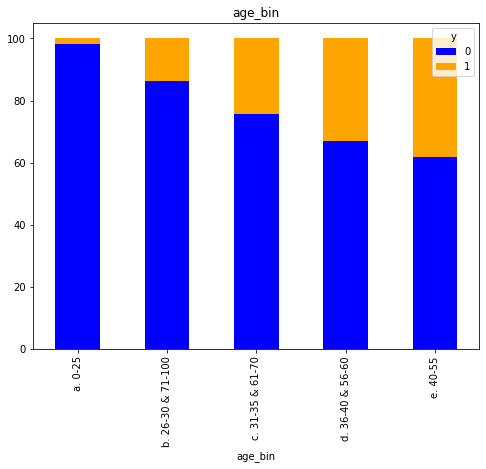

In [163]:
#Stacked Bar Chart for age_bin
var = data.groupby(['age_bin','y']).age_bin.count()
var2 = data.groupby('age_bin').age_bin.count()
var3 = var/var2*100
var3.unstack().plot(kind='bar',stacked=True,title = 'age_bin',  color=['blue','orange'],
                    grid=False,figsize=(8, 6))
display (var)
display (var2)


capital_gl_bin  y
a. = 0          0    34473
                1     8052
b. < 0          0     1138
                1     1144
c. > 0          0     1544
                1     2491
Name: capital_gl_bin, dtype: int64

capital_gl_bin
a. = 0    42525
b. < 0     2282
c. > 0     4035
Name: capital_gl_bin, dtype: int64

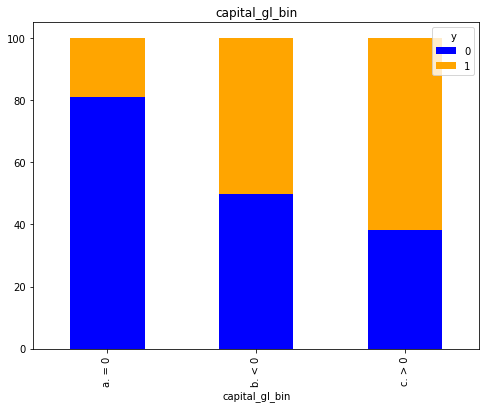

In [164]:
#Stacked Bar Chart for capital_gl_bin
var = data.groupby(['capital_gl_bin','y']).capital_gl_bin.count()
var2 = data.groupby('capital_gl_bin').capital_gl_bin.count()
var3 = var/var2*100
var3.unstack().plot(kind='bar',stacked=True,title = 'capital_gl_bin',  color=['blue','orange'],
                    grid=False,figsize=(8, 6))
display (var)
display (var2)

education_bin  y
a. Low         0     6042
               1      366
b. Mid         0    24823
               1     5501
c. Bachelors   0     4712
               1     3313
d. Masters     0     1198
               1     1459
e. High        0      380
               1     1048
Name: education_bin, dtype: int64

education_bin
a. Low           6408
b. Mid          30324
c. Bachelors     8025
d. Masters       2657
e. High          1428
Name: education_bin, dtype: int64

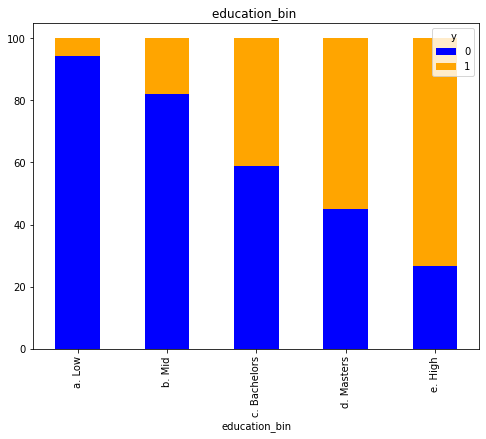

In [165]:
#Stacked Bar Chart for education_bin
var = data.groupby(['education_bin','y']).education_bin.count()
var2 = data.groupby('education_bin').education_bin.count ()
var3 = var/var2*100
var3.unstack().plot(kind='bar',stacked=True,title = 'education_bin ',  color=['blue','orange'],
                    grid=False,figsize=(8, 6))
display (var)
display (var2)

hours_per_week_bin  y
a. 0-30             0     7325
                    1      526
b. 31-40            0    21220
                    1     5419
c. 71-100           0      507
                    1      267
d. 41-50 & 61-70    0     5968
                    1     3851
e. 51-60            0     2135
                    1     1624
Name: hours_per_week_bin, dtype: int64

hours_per_week_bin
a. 0-30              7851
b. 31-40            26639
c. 71-100             774
d. 41-50 & 61-70     9819
e. 51-60             3759
Name: hours_per_week_bin, dtype: int64

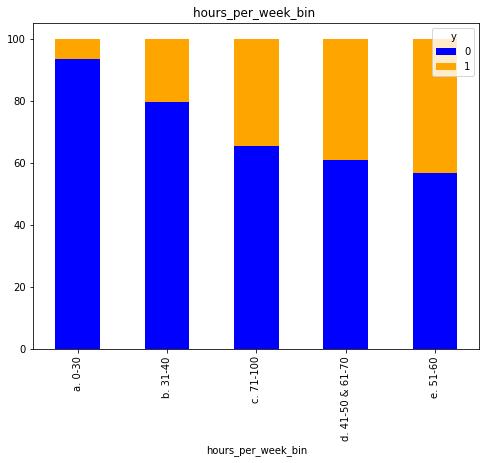

In [166]:
#Stacked Bar Chart for hours_per_week_bin
var = data.groupby(['hours_per_week_bin','y']).hours_per_week_bin.count()
var2 = data.groupby('hours_per_week_bin').hours_per_week_bin.count ()
var3 = var/var2*100
var3.unstack().plot(kind='bar',stacked=True,title = 'hours_per_week_bin ',  color=['blue','orange'],
                    grid=False,figsize=(8, 6))
display (var)
display (var2)

msr_bin  y
a. Low   0    10751
         1      176
b. Mid   0    14296
         1     1572
c. High  0    12108
         1     9939
Name: msr_bin, dtype: int64

msr_bin
a. Low     10927
b. Mid     15868
c. High    22047
Name: msr_bin, dtype: int64

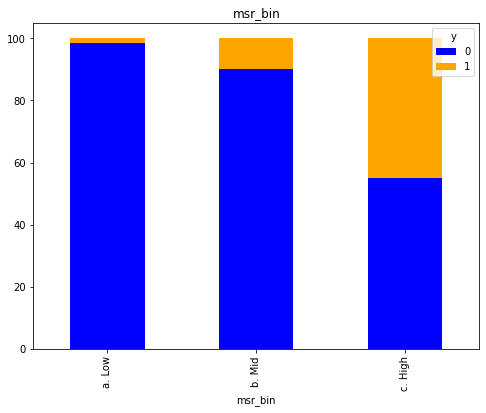

In [167]:
#Stacked Bar Chart for msr_bin
var = data.groupby(['msr_bin','y']).msr_bin.count()
var2 = data.groupby('msr_bin').msr_bin.count ()
var3 = var/var2*100
var3.unstack().plot(kind='bar',stacked=True,title = 'msr_bin',  color=['blue','orange'],
                    grid=False,figsize=(8, 6))
display (var)
display (var2)

occupation_bin  y
a. Low          0     6892
                1      345
b. Mid - Low    0    11364
                1     1583
c. Mid - Mid    0    10632
                1     3339
d. Mid - High   0     1701
                1      728
e. High         0     6566
                1     5692
Name: occupation_bin, dtype: int64

occupation_bin
a. Low            7237
b. Mid - Low     12947
c. Mid - Mid     13971
d. Mid - High     2429
e. High          12258
Name: occupation_bin, dtype: int64

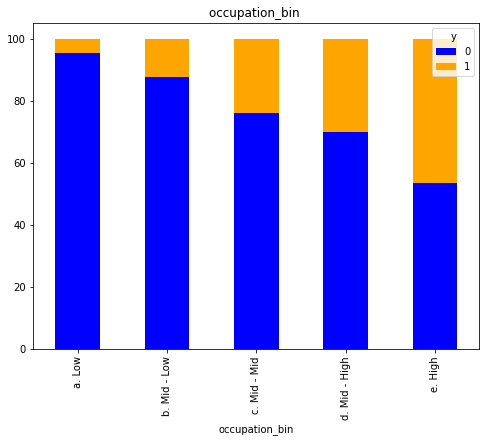

In [168]:
#Stacked Bar Chart for occupation_bin
var = data.groupby(['occupation_bin','y']).occupation_bin.count()
var2 = data.groupby('occupation_bin').occupation_bin.count ()
var3 = var/var2*100
var3.unstack().plot(kind='bar',stacked=True,title = 'occupation_bin ',  color=['blue','orange'],
                    grid=False,figsize=(8, 6))
display (var)
display (var2)

race_sex_bin  y
a. Low        0     2490
              1      158
b. Mid        0    14333
              1     2124
c. High       0    20332
              1     9405
Name: race_sex_bin, dtype: int64

race_sex_bin
a. Low      2648
b. Mid     16457
c. High    29737
Name: race_sex_bin, dtype: int64

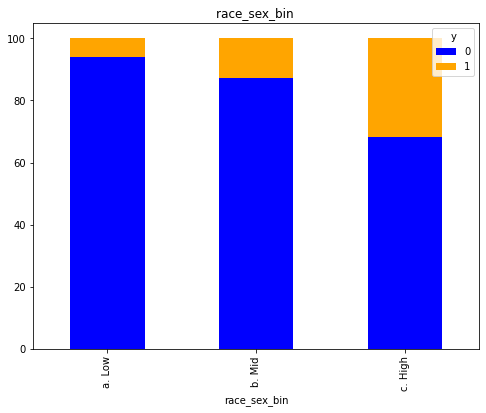

In [169]:
#Stacked Bar Chart for race_sex_bin
var = data.groupby(['race_sex_bin','y']).race_sex_bin.count()
var2 = data.groupby('race_sex_bin').race_sex_bin.count ()
var3 = var/var2*100
var3.unstack().plot(kind='bar',stacked=True,title = 'race_sex_bin ',  color=['blue','orange'],
                    grid=False,figsize=(8, 6))
display (var)
display (var2)

# 3.Building Decision Tree Classifier Model

In [182]:
# 3.Building Decision Tree Classifier Model
feature_cols = ['age_bin','capital_gl_bin', 'education_bin','hours_per_week_bin',
                'msr_bin','occupation_bin','race_sex_bin']
X = data[feature_cols] #features selection
t = data.y #splitting dataset into features and target variables

# splitting dataset into training set and testing set (70% training, 30% testing)
X_train, X_test, t_train, t_test = train_test_split(X,t,test_size = 0.30, random_state = 1)  
#(in this case, y=ax1+ax2+ax3+....b, meaning y(is this person making >50k?) is determined by ax1(age),ax2(occupation), ax3, ...+ y


#building decision tree model
# create decision tree classifier object
clf = DecisionTreeClassifier(max_depth =10, random_state = 101,
                              max_features = None, min_samples_leaf =15)
encoder = OrdinalEncoder(cols = ['age_bin','capital_gl_bin', 'education_bin','hours_per_week_bin',
                                 'msr_bin','occupation_bin','race_sex_bin'], 
                         handle_unknown = 'value', 
                         handle_missing = 'value').fit(X_train,t_train) #OrdinalEncoder transfers object data into float
X_train = encoder.transform(X_train)
X_test = encoder.transform(X_test)
       

# Train Decision Tree Classifier
clf = clf.fit(X_train, t_train)


# Predicting the response for test dataset
y_pred = clf.predict(X_test)

# Evaluating model
#model accuracy/frequency of the classifier being correct
print("Accuracy:", metrics.accuracy_score(t_test, y_pred))




Accuracy: 0.8419436292909301


In [183]:
encoder = OrdinalEncoder(cols = ['age_bin','capital_gl_bin', 'education_bin','hours_per_week_bin',
                                 'msr_bin','occupation_bin','race_sex_bin'], 
                         handle_unknown = 'value', 
                         handle_missing = 'value').fit(X_train,t_train) #OrdinalEncoder transfers object data into float
X_train = encoder.transform(X_train)
X_test = encoder.transform(X_test)
print(X_train)

       age_bin  capital_gl_bin  ...  occupation_bin  race_sex_bin
15474        1               1  ...               1             1
32195        2               1  ...               2             1
26472        3               1  ...               1             1
41624        1               1  ...               3             2
38940        4               1  ...               2             1
...        ...             ...  ...             ...           ...
43723        3               1  ...               1             1
32511        1               1  ...               1             3
5192         5               2  ...               4             1
12172        4               1  ...               1             1
33003        1               1  ...               2             2

[34189 rows x 7 columns]


# 4. Visualizing Decision Tree using GraphViz

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.782439 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.782439 to fit



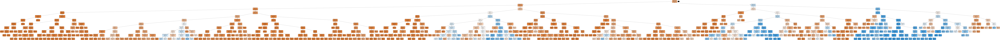

In [184]:
#Visualizing Decision Tree using GraphViz
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('income.png')
Image(graph.create_png())

# 5. Evaluating Tree Performance

[[10282   870]
 [ 1446  2055]]


None

              precision    recall  f1-score   support

           0       0.88      0.92      0.90     11152
           1       0.70      0.59      0.64      3501

    accuracy                           0.84     14653
   macro avg       0.79      0.75      0.77     14653
weighted avg       0.84      0.84      0.84     14653



None

Accuracy: 0.8419436292909301


None

auc is 0.7544811187375444


None

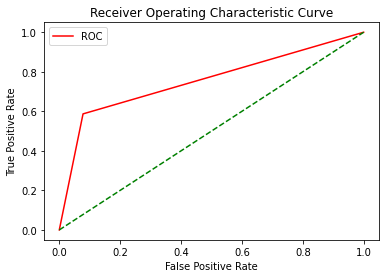

In [185]:
#Evaluating Tree Performance
display(print(confusion_matrix(t_test, y_pred))) # confusion matrix
display(print(classification_report(t_test, y_pred)))
display(print("Accuracy:", metrics.accuracy_score(t_test, y_pred)))
def plot_roc_curve(false_positive_rate, true_positive_rate):
    plt.plot(false_positive_rate, true_positive_rate, color='red', label='ROC')
    plt.plot([0, 1], [0, 1], color='green', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic Curve')
    plt.legend()
    plt.show()
false_positive_rate, true_positive_rate, thresholds = roc_curve(t_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)


display(print("auc is", auc(false_positive_rate, true_positive_rate)))
plot_roc_curve(false_positive_rate, true_positive_rate)


# 6. Tuning Decision Tree Performance

In [186]:
#Tuning Decision Tree Performance
#feature selection
#splitting dataset in features and target variable
feature_cols = ['age_bin','capital_gl_bin', 'education_bin','hours_per_week_bin',
                'msr_bin','occupation_bin','race_sex_bin']
X = data[feature_cols]
t = data.y 

# splitting data
# split dataset into training set and test set
X_train, X_test, t_train, t_test = train_test_split(X,t,test_size = 0.30, random_state = 1) # 70% training and 30% testing

#building decision tree model
# creating decision tree classifier object
clf = DecisionTreeClassifier(criterion='gini', min_samples_split=5, min_samples_leaf=5, max_depth=9)
encoder = OrdinalEncoder(cols = ['age_bin','capital_gl_bin', 'education_bin','hours_per_week_bin',
                                 'msr_bin','occupation_bin','race_sex_bin'], 
                         handle_unknown = 'value', 
                         handle_missing = 'value').fit(X_train,t_train)
X_train = encoder.transform(X_train)
X_test = encoder.transform(X_test)
       

# Training Decision Tree Classifier
clf = clf.fit(X_train, t_train)


# predicting the response for test dataset
y_pred = clf.predict(X_test)

# Evaluating model
#model accuracy, frequency of the classifier being correct
display(print("Accuracy:", metrics.accuracy_score(t_test, y_pred)))
display(print(classification_report(t_test, y_pred)))

# Q.8.3 Draw the Graph of the BEST TREE Using GraphViz
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1'])




Accuracy: 0.8426260833958916


None

              precision    recall  f1-score   support

           0       0.88      0.92      0.90     11152
           1       0.70      0.60      0.65      3501

    accuracy                           0.84     14653
   macro avg       0.79      0.76      0.77     14653
weighted avg       0.84      0.84      0.84     14653



None

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.717175 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.717175 to fit



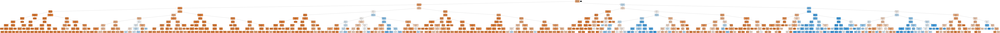

In [187]:
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('income.png')
Image(graph.create_png())

# 8. Automation of Performance Tuning

In [188]:
income = files.upload()

Saving TreeTuningCases1.csv to TreeTuningCases1 (5).csv


In [190]:
automation = pd.read_csv(io.BytesIO(income['TreeTuningCases1.csv']))
automation

,Split Criteria (Entropy or Gini),Minimum Sample Split,Minimum Sample Leaf,Maximum Depth,Accuracy,Recall,Precision,F1 Score
0,entropy,9,9,9,NaN,NaN,NaN,NaN
1,entropy,7,9,8,NaN,NaN,NaN,NaN
2,entropy,5,5,5,NaN,NaN,NaN,NaN
3,entropy,5,8,3,NaN,NaN,NaN,NaN
4,gini,5,5,9,NaN,NaN,NaN,NaN
5,gini,3,5,8,NaN,NaN,NaN,NaN
6,gini,2,4,6,NaN,NaN,NaN,NaN
7,gini,6,8,8,NaN,NaN,NaN,NaN


In [191]:
automation.columns


Index(['Split Criteria (Entropy or Gini)', 'Minimum Sample Split',
       'Minimum Sample Leaf', 'Maximum Depth', 'Accuracy', 'Recall',
       'Precision', 'F1 Score'],
      dtype='object')

In [192]:
#create function that will allow values to be automatically filled in when attempting to identify best model 
#based on hard-coded hyperparameters 
accuracy_list=[]
recall_list=[]
precision_list=[]
f1_list=[]

for row in range(8):
  automation_slice = automation.iloc[0,0:4]
  for item in automation:
    item_slice = automation.iloc[0,0]
    item_slice_2 = automation.iloc[0,1]
    item_slice_3 = automation.iloc[0,2]
    item_slice_4 = automation.iloc[0,3]

    dtree = DecisionTreeClassifier(min_samples_split=item_slice_2, min_samples_leaf=item_slice_3,
                                   max_depth=item_slice_4, random_state=101, max_features=None, criterion=item_slice)
    dtree.fit(X_train, t_train)
    y_pred = dtree.predict(X_test)

    accuracy_sc = accuracy_score(t_test, y_pred)
    recall_sc = recall_score(t_test, y_pred)
    precision_sc = precision_score(t_test, y_pred)
    f1 = f1_score(t_test, y_pred)
  accuracy_list.append(accuracy_sc)
  recall_list.append(recall_sc)
  precision_list.append(precision_sc)
  f1_list.append(f1)
automation.loc[automation.Accuracy.isnull(), 'Accuracy'] = accuracy_list
automation.loc[automation.Recall.isnull(), 'Recall'] = recall_list
automation.loc[automation.Precision.isnull(), 'Precision'] = precision_list
automation.loc[automation['F1 Score'].isnull(), 'F1 Score'] = f1_list

In [193]:
automation

,Split Criteria (Entropy or Gini),Minimum Sample Split,Minimum Sample Leaf,Maximum Depth,Accuracy,Recall,Precision,F1 Score
0,entropy,9,9,9,0.842353,0.587261,0.703869,0.640299
1,entropy,7,9,8,0.842353,0.587261,0.703869,0.640299
2,entropy,5,5,5,0.842353,0.587261,0.703869,0.640299
3,entropy,5,8,3,0.842353,0.587261,0.703869,0.640299
4,gini,5,5,9,0.842353,0.587261,0.703869,0.640299
5,gini,3,5,8,0.842353,0.587261,0.703869,0.640299
6,gini,2,4,6,0.842353,0.587261,0.703869,0.640299
7,gini,6,8,8,0.842353,0.587261,0.703869,0.640299


# 9. Prediction using Trained Decision Tree Model

In [194]:
#Prediction using Trained Decision Tree Model
encoder
a = ([[2,2,3,1,1,3,2]])
pre_result = clf.predict(a)
display(print("prediction is ", str(pre_result)))
probs = clf.predict_proba(a)
display(print("the probability of the outcome of the prediction is",str(probs)))


prediction is  [0]


/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  "X does not have valid feature names, but"


None

the probability of the outcome of the prediction is [[0.88235294 0.11764706]]


/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  "X does not have valid feature names, but"


None

In [206]:
#create new record 
n_rec = {'hours_per_week_bin':'d. 41-50 & 61-70', 'occupation_bin':'b. Mid-Low' , 'msr_bin':'c. High',
         'capital_gl_bin':'c. > 0','race_sex_bin':'b. Mid', 
         'education_bin':'e. High',
         'age_bin':'d. 36-40 & 56-60'}
n_rec
#create mock dataframe 
new_df = pd.DataFrame(data = n_rec, index=[0])
#change datatype to category 
for column in ['hours_per_week_bin','occupation_bin','msr_bin', 'capital_gl_bin',
       'race_sex_bin',  'education_bin', 
       'age_bin']:
    new_df[column] = new_df[column].astype('category')
#check the data type
new_df.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 1 entries, 0 to 0
Data columns (total 7 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   hours_per_week_bin  1 non-null      category
 1   occupation_bin      1 non-null      category
 2   msr_bin             1 non-null      category
 3   capital_gl_bin      1 non-null      category
 4   race_sex_bin        1 non-null      category
 5   education_bin       1 non-null      category
 6   age_bin             1 non-null      category
dtypes: category(7)
memory usage: 827.0 bytes


In [207]:
#use label encoder to convert data to labels 
new_df[['hours_per_week_bin','occupation_bin','msr_bin', 'capital_gl_bin',
       'race_sex_bin', 'education_bin', 
       'age_bin']]= data[['hours_per_week_bin','occupation_bin','msr_bin', 'capital_gl_bin',
       'race_sex_bin', 'education_bin', 
       'age_bin']].apply(LabelEncoder().fit_transform) 
#check that the output is as expected
new_df.head()
#use the best model to predict income level based on above criteria 
#output is [0.72] in the binary ([0,1]), meaning that the individual is 72% likely to have an income of above $50k 
new_pred = dtree.predict_proba(new_df)
new_pred

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names must be in the same order as they were in fit.

  warnings.warn(message, FutureWarning)


array([[0.86111111, 0.13888889]])